In [1]:
import os
import pathlib

# Clone the tensorflow models repository if it doesn't already exist
if "models" in pathlib.Path.cwd().parts:
  while "models" in pathlib.Path.cwd().parts:
    os.chdir('..')
elif not pathlib.Path('models').exists():
  !git clone --depth 1 https://github.com/tensorflow/models

Cloning into 'models'...
remote: Enumerating objects: 3996, done.
remote: Counting objects: 100% (3996/3996), done.
remote: Compressing objects: 100% (3111/3111), done.
remote: Total 3996 (delta 1151), reused 1961 (delta 828), pack-reused 0
Receiving objects: 100% (3996/3996), 53.32 MiB | 23.28 MiB/s, done.
Resolving deltas: 100% (1151/1151), done.


In [2]:
!pip uninstall Cython -y

Found existing installation: Cython 3.0.4
Uninstalling Cython-3.0.4:
  Successfully uninstalled Cython-3.0.4


In [3]:
# Install the Object Detection API
%%bash
cd models/research/
protoc object_detection/protos/*.proto --python_out=.
cp object_detection/packages/tf2/setup.py .
python -m pip install .

Processing /content/models/research
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.7/14.7 MB 44.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.6/3.6 MB 61.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.7/2.7 MB 68.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 28.8/28.8 MB 45.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 8.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.6/116.6 kB 12.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 50.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.6/43.6 kB 6.4 MB/s eta 0:00:00
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
     ━━━━━━━━━━━

In [4]:
!mkdir training

In [5]:
# !cp /content/drive/MyDrive/Project-1/EfficientDet\ Model/training/checkpoint /content/training
# !cp /content/drive/MyDrive/Project-1/EfficientDet\ Model/training/ckpt-15.data-00000-of-00001 /content/training
# !cp /content/drive/MyDrive/Project-1/EfficientDet\ Model/training/ckpt-15.index /content/training

In [6]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [7]:
!cp -av /content/drive/MyDrive/Project-1/fine_tuned_model_v2/fine_tuned_model /content
!cp -av /content/drive/MyDrive/Project-1/TrainingCheckpoints/training /content

'/content/drive/MyDrive/Project-1/fine_tuned_model_v2/fine_tuned_model' -> '/content/fine_tuned_model'
'/content/drive/MyDrive/Project-1/fine_tuned_model_v2/fine_tuned_model/checkpoint' -> '/content/fine_tuned_model/checkpoint'
'/content/drive/MyDrive/Project-1/fine_tuned_model_v2/fine_tuned_model/checkpoint/checkpoint' -> '/content/fine_tuned_model/checkpoint/checkpoint'
'/content/drive/MyDrive/Project-1/fine_tuned_model_v2/fine_tuned_model/checkpoint/ckpt-0.data-00000-of-00001' -> '/content/fine_tuned_model/checkpoint/ckpt-0.data-00000-of-00001'
'/content/drive/MyDrive/Project-1/fine_tuned_model_v2/fine_tuned_model/checkpoint/ckpt-0.index' -> '/content/fine_tuned_model/checkpoint/ckpt-0.index'
'/content/drive/MyDrive/Project-1/fine_tuned_model_v2/fine_tuned_model/saved_model' -> '/content/fine_tuned_model/saved_model'
'/content/drive/MyDrive/Project-1/fine_tuned_model_v2/fine_tuned_model/saved_model/variables' -> '/content/fine_tuned_model/saved_model/variables'
'/content/drive/MyDri

In [8]:
import matplotlib
import matplotlib.pyplot as plt

import os
import random
import io
import imageio
import glob
import scipy.misc
import numpy as np
from six import BytesIO
from PIL import Image, ImageDraw, ImageFont
from IPython.display import display, Javascript
from IPython.display import Image as IPyImage

import tensorflow as tf

from object_detection.utils import label_map_util
from object_detection.utils import config_util
from object_detection.utils import visualization_utils as viz_utils
from object_detection.utils import colab_utils
from object_detection.builders import model_builder

%matplotlib inline

In [9]:
##change chosen model to deploy different models available in the TF2 object detection zoo
MODELS_CONFIG = {
    'efficientdet-d0': {
        'model_name': 'efficientdet_d0_coco17_tpu-32',
        'base_pipeline_file': 'ssd_efficientdet_d0_512x512_coco17_tpu-8.config',
        'pretrained_checkpoint': 'efficientdet_d0_coco17_tpu-32.tar.gz',
        'batch_size': 10
    },
    'efficientdet-d1': {
        'model_name': 'efficientdet_d1_coco17_tpu-32',
        'base_pipeline_file': 'ssd_efficientdet_d1_640x640_coco17_tpu-8.config',
        'pretrained_checkpoint': 'efficientdet_d1_coco17_tpu-32.tar.gz',
        'batch_size': 10
    },
    'efficientdet-d2': {
        'model_name': 'efficientdet_d2_coco17_tpu-32',
        'base_pipeline_file': 'ssd_efficientdet_d2_768x768_coco17_tpu-8.config',
        'pretrained_checkpoint': 'efficientdet_d2_coco17_tpu-32.tar.gz',
        'batch_size': 10
    },
        'efficientdet-d3': {
        'model_name': 'efficientdet_d3_coco17_tpu-32',
        'base_pipeline_file': 'ssd_efficientdet_d3_896x896_coco17_tpu-32.config',
        'pretrained_checkpoint': 'efficientdet_d3_coco17_tpu-32.tar.gz',
        'batch_size': 10
    }
}

#in this tutorial we implement the lightweight, smallest state of the art efficientdet model
#if you want to scale up tot larger efficientdet models you will likely need more compute!
chosen_model = 'efficientdet-d0'

num_steps = 7300 #The more steps, the longer the training. Increase if your loss function is still decreasing and validation metrics are increasing.
num_eval_steps = 400 #Perform evaluation after so many steps

model_name = MODELS_CONFIG[chosen_model]['model_name']
pretrained_checkpoint = MODELS_CONFIG[chosen_model]['pretrained_checkpoint']
base_pipeline_file = MODELS_CONFIG[chosen_model]['base_pipeline_file']
batch_size = MODELS_CONFIG[chosen_model]['batch_size'] #if you can fit a large batch in memory, it may speed up your training

In [10]:
#download pretrained weights
%mkdir /content/models/research/deploy/
%cd /content/models/research/deploy/
import tarfile
download_tar = 'http://download.tensorflow.org/models/object_detection/tf2/20200711/' + pretrained_checkpoint

!wget {download_tar}
tar = tarfile.open(pretrained_checkpoint)
tar.extractall()
tar.close()

/content/models/research/deploy
--2023-10-31 19:51:49--  http://download.tensorflow.org/models/object_detection/tf2/20200711/efficientdet_d0_coco17_tpu-32.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 74.125.197.207, 74.125.135.207, 74.125.142.207, ...
Connecting to download.tensorflow.org (download.tensorflow.org)|74.125.197.207|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 30736482 (29M) [application/x-tar]
Saving to: ‘efficientdet_d0_coco17_tpu-32.tar.gz’

efficientdet_d0_coc 100%[===================>]  29.31M   194MB/s    in 0.2s    

2023-10-31 19:51:50 (194 MB/s) - ‘efficientdet_d0_coco17_tpu-32.tar.gz’ saved [30736482/30736482]



In [11]:
#download base training configuration file
%cd /content/models/research/deploy
download_config = 'https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/configs/tf2/' + base_pipeline_file
!wget {download_config}

/content/models/research/deploy
--2023-10-31 19:51:50--  https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/configs/tf2/ssd_efficientdet_d0_512x512_coco17_tpu-8.config
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 4630 (4.5K) [text/plain]
Saving to: ‘ssd_efficientdet_d0_512x512_coco17_tpu-8.config’

ssd_efficientdet_d0 100%[===================>]   4.52K  --.-KB/s    in 0s      

2023-10-31 19:51:50 (68.5 MB/s) - ‘ssd_efficientdet_d0_512x512_coco17_tpu-8.config’ saved [4630/4630]



In [12]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="C7t6SWdiPn9568uwJat9")
project = rf.workspace("safe-bite").project("safe-bite-2")
dataset = project.version(1).download("tfrecord")

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 2.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 155.3/155.3 kB 6.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 6.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 7.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.1/49.1 MB 11.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 72.2/72.2 kB 10.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 8.9 MB/s eta 0:00:00
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.8.1.78
    Uninstalling opencv-python-headless-4.8.1.78:
      Successfully uninstalled opencv-python-headless-4.8.1.78
  Attempting uninstall: idna
    Found existing installation: idna 3.4
    Uninstalling idna-3.4:
      Successfully uninstalled idna-3.4
  Attempting uninstall: cycler
    Found existing installation: cycler 

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Safe-Bite-2-1 in tfrecord:: 100%|██████████| 8/8 [00:00<00:00, 38.11it/s]


In [13]:
# NOTE: Update these TFRecord names from "cells" and "cells_label_map" to your files!
test_record_fname = dataset.location + '/test/Nutrition-Table-and-Ingredients.tfrecord'
train_record_fname = dataset.location + '/train/Nutrition-Table-and-Ingredients.tfrecord'
label_map_pbtxt_fname = dataset.location + '/train/Nutrition-Table-and-Ingredients_label_map.pbtxt'

In [14]:
dataset.location

'/content/models/research/deploy/Safe-Bite-2-1'

In [15]:
#prepare
pipeline_fname = '/content/models/research/deploy/' + base_pipeline_file
fine_tune_checkpoint = '/content/models/research/deploy/' + model_name + '/checkpoint/ckpt-0'

def get_num_classes(pbtxt_fname):
    from object_detection.utils import label_map_util
    label_map = label_map_util.load_labelmap(pbtxt_fname)
    categories = label_map_util.convert_label_map_to_categories(
        label_map, max_num_classes=90, use_display_name=True)
    category_index = label_map_util.create_category_index(categories)
    return len(category_index.keys())
num_classes = get_num_classes(label_map_pbtxt_fname)

In [16]:
#write custom configuration file by slotting our dataset, model checkpoint, and training parameters into the base pipeline file

import re

%cd /content/models/research/deploy
print('writing custom configuration file')

with open(pipeline_fname) as f:
    s = f.read()
with open('pipeline_file.config', 'w') as f:

    # fine_tune_checkpoint
    s = re.sub('fine_tune_checkpoint: ".*?"',
               'fine_tune_checkpoint: "{}"'.format(fine_tune_checkpoint), s)

    # tfrecord files train and test.
    s = re.sub(
        '(input_path: ".*?)(PATH_TO_BE_CONFIGURED/train)(.*?")', 'input_path: "{}"'.format(train_record_fname), s)
    s = re.sub(
        '(input_path: ".*?)(PATH_TO_BE_CONFIGURED/val)(.*?")', 'input_path: "{}"'.format(test_record_fname), s)

    # label_map_path
    s = re.sub(
        'label_map_path: ".*?"', 'label_map_path: "{}"'.format(label_map_pbtxt_fname), s)

    # Set training batch_size.
    s = re.sub('batch_size: [0-9]+',
               'batch_size: {}'.format(batch_size), s)

    # Set training steps, num_steps
    s = re.sub('num_steps: [0-9]+',
               'num_steps: {}'.format(num_steps), s)

    # Set number of classes num_classes.
    s = re.sub('num_classes: [0-9]+',
               'num_classes: {}'.format(num_classes), s)

    #fine-tune checkpoint type
    s = re.sub(
        'fine_tune_checkpoint_type: "classification"', 'fine_tune_checkpoint_type: "{}"'.format('detection'), s)

    f.write(s)



/content/models/research/deploy
writing custom configuration file


In [17]:
pipeline_file = '/content/models/research/deploy/pipeline_file.config'

In [18]:
import matplotlib
import matplotlib.pyplot as plt

import io
import scipy.misc
import numpy as np
from six import BytesIO
from PIL import Image, ImageDraw, ImageFont

import tensorflow as tf

from object_detection.utils import label_map_util
from object_detection.utils import config_util
from object_detection.utils import visualization_utils as viz_utils
from object_detection.builders import model_builder

%matplotlib inline

In [19]:
def load_image_into_numpy_array(path):
  """Load an image from file into a numpy array.

  Puts image into numpy array to feed into tensorflow graph.
  Note that by convention we put it into a numpy array with shape
  (height, width, channels), where channels=3 for RGB.

  Args:
    path: the file path to the image

  Returns:
    uint8 numpy array with shape (img_height, img_width, 3)
  """
  img_data = tf.io.gfile.GFile(path, 'rb').read()
  image = Image.open(BytesIO(img_data))
  (im_width, im_height) = image.size
  return np.array(image.getdata()).reshape(
      (im_height, im_width, 3)).astype(np.uint8)

In [20]:
import pathlib

filenames = list(pathlib.Path('/content/training/').glob('*.index'))

filenames.sort()
print(filenames)

#recover our saved model
pipeline_config = pipeline_file
#generally you want to put the last ckpt from training in here
model_dir = str(filenames[-1]).replace('.index','')
configs = config_util.get_configs_from_pipeline_file(pipeline_config)
model_config = configs['model']
detection_model = model_builder.build(
      model_config=model_config, is_training=False)

# Restore checkpoint
ckpt = tf.compat.v2.train.Checkpoint(
      model=detection_model)
ckpt.restore(os.path.join(str(filenames[-1]).replace('.index','')))


def get_model_detection_function(model):
  """Get a tf.function for detection."""

  @tf.function
  def detect_fn(image):
    """Detect objects in image."""

    image, shapes = model.preprocess(image)
    print(shapes)
    prediction_dict = model.predict(image, shapes)
    detections = model.postprocess(prediction_dict, shapes)

    return detections, prediction_dict, tf.reshape(shapes, [-1])

  return detect_fn

detect_fn = get_model_detection_function(detection_model)

[PosixPath('/content/training/ckpt-21.index'), PosixPath('/content/training/ckpt-22.index'), PosixPath('/content/training/ckpt-23.index'), PosixPath('/content/training/ckpt-24.index'), PosixPath('/content/training/ckpt-25.index'), PosixPath('/content/training/ckpt-26.index'), PosixPath('/content/training/ckpt-27.index')]


In [21]:
#map labels for inference decoding
label_map_path = configs['eval_input_config'].label_map_path
label_map = label_map_util.load_labelmap(label_map_path)
categories = label_map_util.convert_label_map_to_categories(
    label_map,
    max_num_classes=label_map_util.get_max_label_map_index(label_map),
    use_display_name=True)
category_index = label_map_util.create_category_index(categories)
label_map_dict = label_map_util.get_label_map_dict(label_map, use_display_name=True)

Tensor("Preprocessor/stack_1:0", shape=(1, 3), dtype=int32)
Tensor("Preprocessor/stack_1:0", shape=(1, 3), dtype=int32)


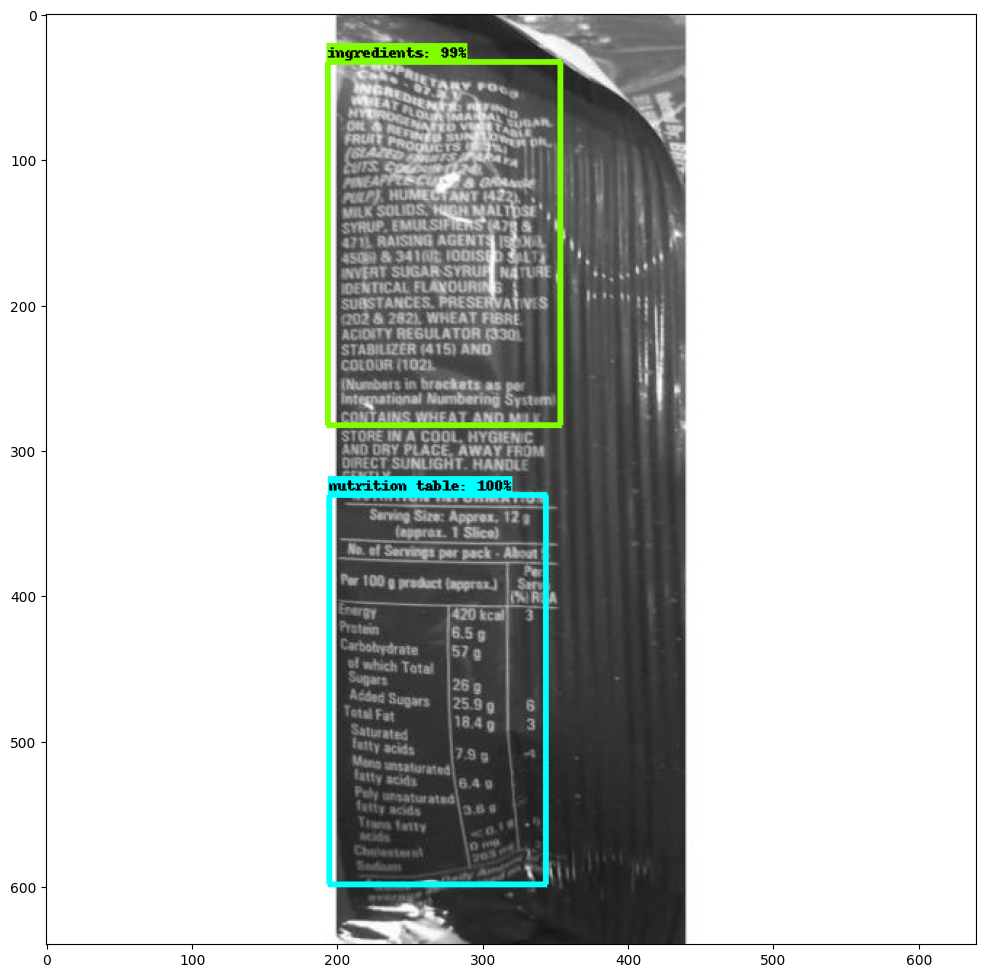

In [22]:
#run detector on test image
#it takes a little longer on the first run and then runs at normal speed.
import random

TEST_IMAGE_PATHS = glob.glob('/content/drive/MyDrive/Project-1/Test Data/*.jpg')
image_path = random.choice(TEST_IMAGE_PATHS)
# image_path='/content/Image171.jpg'
image_np = load_image_into_numpy_array(image_path)


# Things to try:
# Flip horizontally
# image_np = np.fliplr(image_np).copy()

# Convert image to grayscale
# image_np = np.tile(
#     np.mean(image_np, 2, keepdims=True), (1, 1, 3)).astype(np.uint8)

input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect_fn(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.3,
      agnostic_mode=False,
)

plt.figure(figsize=(12,16))
plt.imshow(image_np_with_detections)
plt.show()

In [23]:
boxes = detections['detection_boxes']
scores = detections['detection_scores'][0]
classes = detections['detection_classes'][0]


img_data = tf.io.gfile.GFile(image_path, 'rb').read()
image = Image.open(BytesIO(img_data))
im_width, im_height = image.size
print(im_width,im_height)

cropped_boxes = []
indexes=[]
i=0
# get the detected boxes with score greater than 0.5
for i in range(len(scores)):
  if scores[i] >= 0.4:
    indexes.append(i)
  i+=1

for index in indexes:
  box = tuple(boxes.numpy()[0][index])
  detected_class = classes[index]
  ymin, xmin, ymax, xmax = int(box[0]*im_height+5),int(box[1]*im_width+5),int(box[2]*im_height+5),int(box[3]*im_width+5)

  cropped_boxes.append(
      tf.image.crop_to_bounding_box(
          image=image,
          offset_height=ymin,
          offset_width=xmin,
          target_height=ymax-ymin,
          target_width=xmax-xmin
      ))

640 640


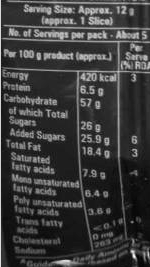

In [24]:
tf.keras.utils.array_to_img(
    cropped_boxes[0], data_format=None, scale=True, dtype=None
)

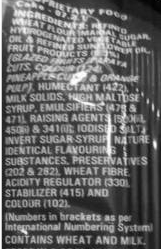

In [25]:
tf.keras.utils.array_to_img(
    cropped_boxes[1], data_format=None, scale=True, dtype=None
)

Accuracy

# Tensorboard

In [26]:
%load_ext tensorboard

In [27]:
%tensorboard --logdir '/content/training/train'

<IPython.core.display.Javascript object>

In [28]:
# tf.keras.utils.array_to_img(
#     cropped_boxes[1], data_format=None, scale=True, dtype=None
# )

In [29]:
# import tensorflow as tf

# saved_model_dir = '/content/fine_tuned_model/saved_model'

# model = tf.saved_model.load(saved_model_dir)
# model.signatures[tf.saved_model.DEFAULT_SERVING_SIGNATURE_DEF_KEY].inputs[0].set_shape([1, 512, 512, 3])
# tf.saved_model.save(model, "saved_model_updated", signatures=model.signatures[tf.saved_model.DEFAULT_SERVING_SIGNATURE_DEF_KEY])

In [30]:
# converter = tf.lite.TFLiteConverter.from_saved_model(saved_model_dir='saved_model_updated', signature_keys=['serving_default'])
# converter.optimizations = [tf.lite.Optimize.DEFAULT]
# converter.target_spec.supported_ops = [tf.lite.OpsSet.TFLITE_BUILTINS, tf.lite.OpsSet.SELECT_TF_OPS]
# tflite_model = converter.convert()

In [31]:
# interpreter = tf.lite.Interpreter(model_content=tflite_model)
# interpreter.allocate_tensors()

In [32]:
# tflite_model_path = '/content/tflite_model/nutriscan_model.tflite'
# tf.io.write_file(tflite_model_path, tflite_model)